In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 911.6/911.6 kB 12.8 MB/s eta 0:00:00


In [3]:
import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
%cd /content/drive/My Drive/Jupyter/DL

/content/drive/My Drive/Jupyter/DL


In [6]:
import os
HOME = os.getcwd()
print(HOME)

/content/drive/My Drive/Jupyter/DL


In [8]:
import zipfile
import os

# Define the path to your zip file
zip_file_path = '/content/drive/My Drive/Jupyter/DL/Car Modals.v1i.yolov8.zip'
# Define the directory where you want to extract the files
extract_dir = '/content/drive/My Drive/Jupyter/DL/extracted_files2/'

# Create the directory if it doesn't exist
os.makedirs(extract_dir, exist_ok=True)

# Unzip the file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

In [12]:
!ls

'Car Modals.v1i.yolov8.zip'   extracted_files2	   yolov8m.pt
 extracted_files	      LPR.v1i.yolov8.zip   yolov8n.pt


In [10]:
import torch

In [13]:
#Load the YOLOv8 Model
model = YOLO('yolov8n.pt')

100%|██████████| 6.25M/6.25M [00:00<00:00, 96.9MB/s]


In [14]:
!yolo task=detect mode=train model=yolov8n.pt data=/content/drive/MyDrive/Jupyter/DL/extracted_files2/data.yaml epochs=30 imgsz=420


Ultralytics 8.3.65 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/Jupyter/DL/extracted_files2/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=420, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_label

In [15]:
!yolo task=detect mode = val model = /content/drive/MyDrive/Jupyter/DL/runs/detect/train/weights/best.pt data = /content/drive/MyDrive/Jupyter/DL/extracted_files2/data.yaml epochs=30 imgsz=420


WARNING ⚠️ imgsz=[420] must be multiple of max stride 32, updating to [448]
Ultralytics 8.3.65 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,011,888 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/drive/MyDrive/Jupyter/DL/extracted_files2/valid/labels.cache... 103 images, 3 backgrounds, 0 corrupt: 100% 103/103 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 7/7 [00:04<00:00,  1.61it/s]
                   all        103        609       0.95      0.935      0.983      0.852
                     1         15         16      0.996          1      0.995      0.828
                    10         14         15      0.974          1      0.995      0.864
                    11         14         14      0.919      0.816      0.981      0.874
                    12         21         26      0.967      0.923       0.99      0.853
                    13         10    

In [18]:
!yolo task=detect mode=predict model=/content/drive/MyDrive/Jupyter/DL/runs/detect/train/weights/best.pt source= /content/drive/MyDrive/Jupyter/DL/extracted_files2/test/images epochs=30 imgsz=420 plots=True

Ultralytics 8.3.65 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,011,888 parameters, 0 gradients, 8.1 GFLOPs

WARNING ⚠️ imgsz=[420] must be multiple of max stride 32, updating to [448]
image 1/49 /content/drive/MyDrive/Jupyter/DL/extracted_files2/test/images/022fa55d-7c2d-45a4-8f9d-9e8e726f6d21_jpg.rf.0c16cea67b84297640e981ab60d23097.jpg: 448x448 1 20, 8.7ms
image 2/49 /content/drive/MyDrive/Jupyter/DL/extracted_files2/test/images/0bc56866-37ab-44fe-9b2e-90874c3e6a02_jpg.rf.4198c03b6191d195806bc987cf3fde57.jpg: 448x448 1 20, 11.0ms
image 3/49 /content/drive/MyDrive/Jupyter/DL/extracted_files2/test/images/9g9vn1b40nia1_jpg.rf.729549b08c6ee38b12ffd7abb9f90d08.jpg: 448x448 1 20, 6.6ms
image 4/49 /content/drive/MyDrive/Jupyter/DL/extracted_files2/test/images/ITbrHXGkkzaOSsNJwFxm0Lk-OAiTUxsq1LdRgbnpPJE_jpg.rf.4979e8a7f97fc9b16af8e6a967e77932.jpg: 448x448 1 20, 6.6ms
image 5/49 /content/drive/MyDrive/Jupyter/DL/extracted_files2/test/imag

In [19]:
from IPython.display import display, Image

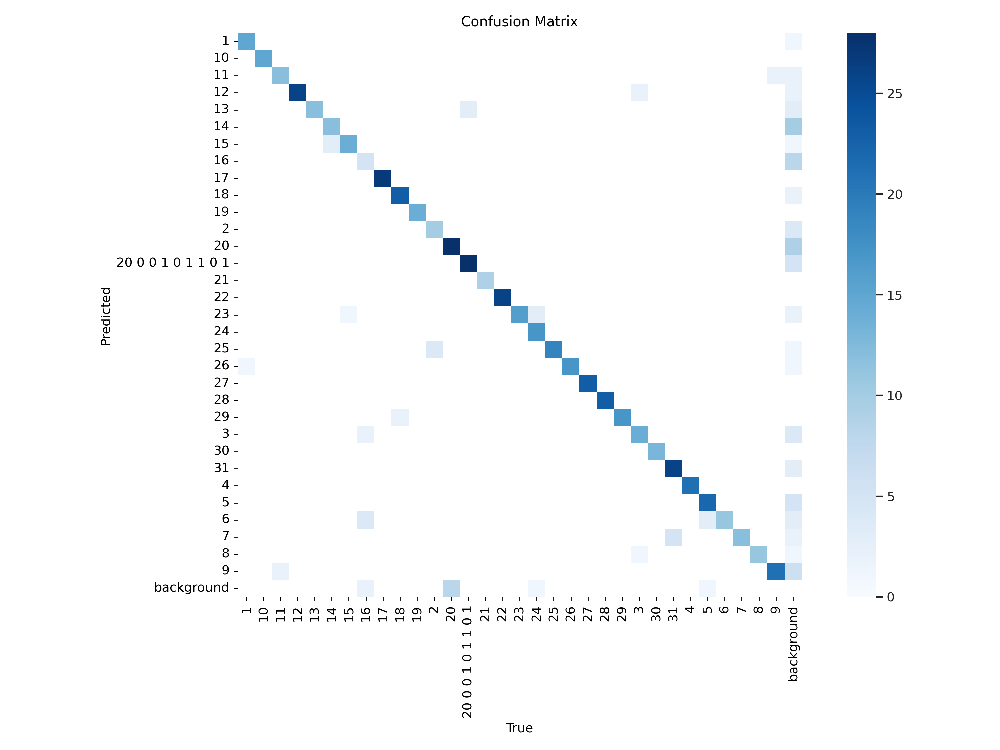

In [20]:
Image(filename='/content/drive/MyDrive/Jupyter/DL/runs/detect/train/confusion_matrix.png',width=300)

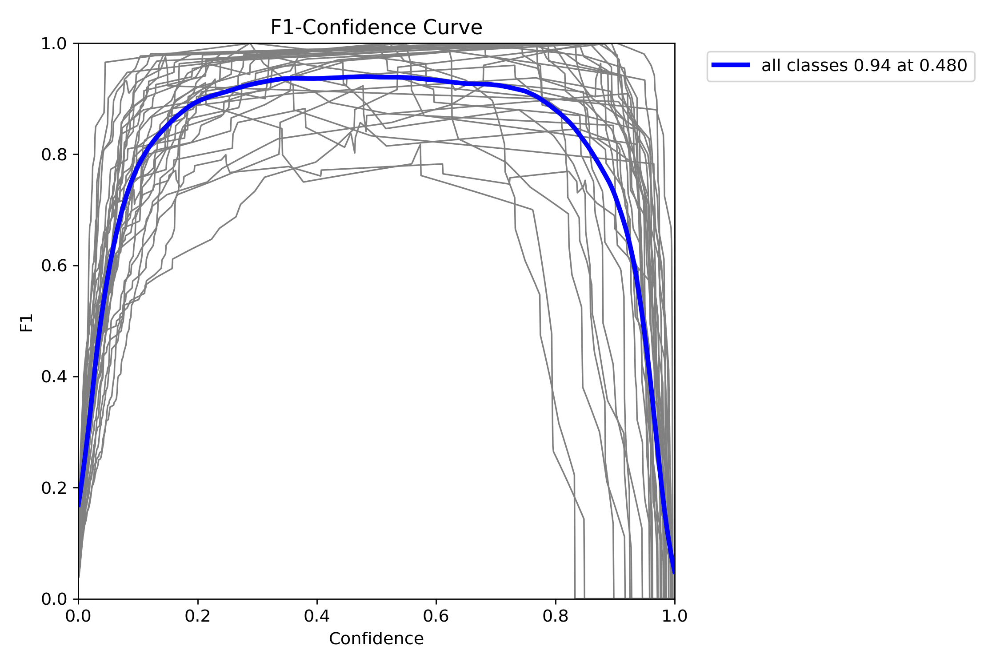

In [21]:
Image(filename='/content/drive/MyDrive/Jupyter/DL/runs/detect/train/F1_curve.png',width=300)

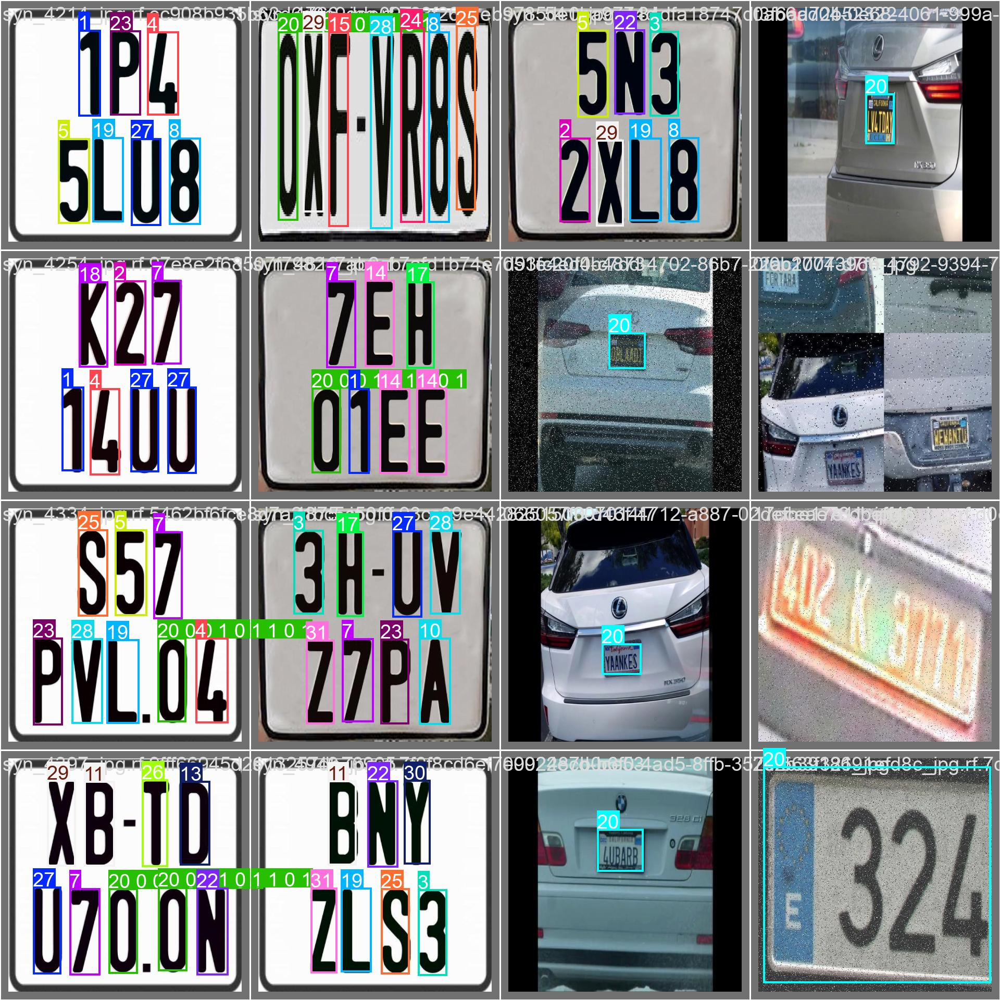

In [22]:
Image(filename = '/content/drive/MyDrive/Jupyter/DL/runs/detect/train/val_batch0_labels.jpg', width = 300)

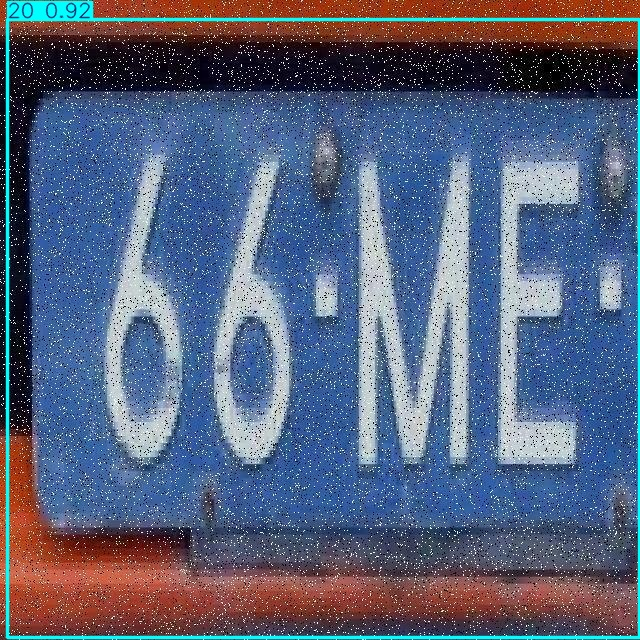

In [23]:
Image(filename = '/content/drive/MyDrive/Jupyter/DL/runs/detect/predict3/images34_jpg.rf.e6efa6d57313f4de8032deb0145302cd.jpg', width = 300)

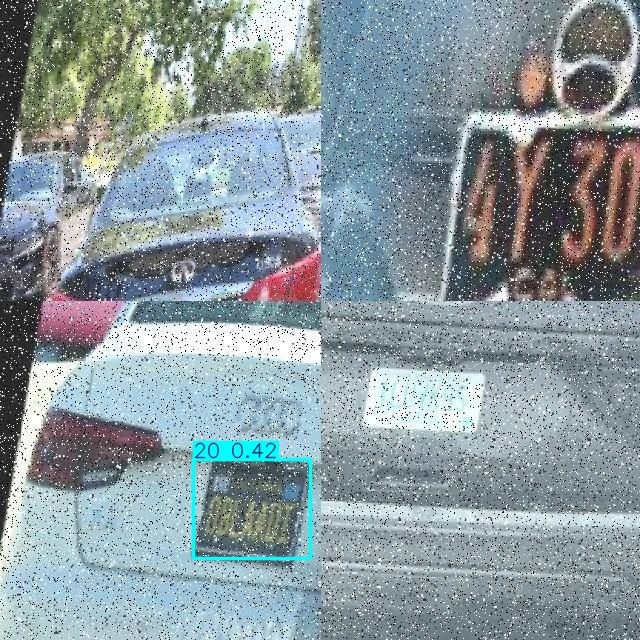

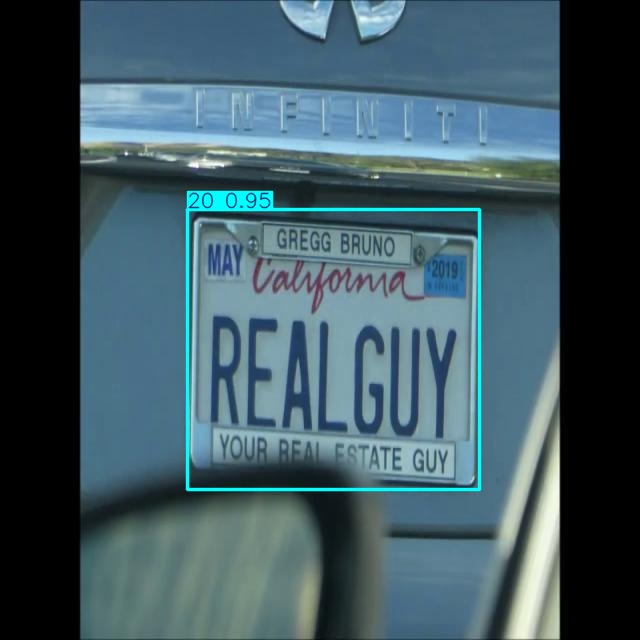

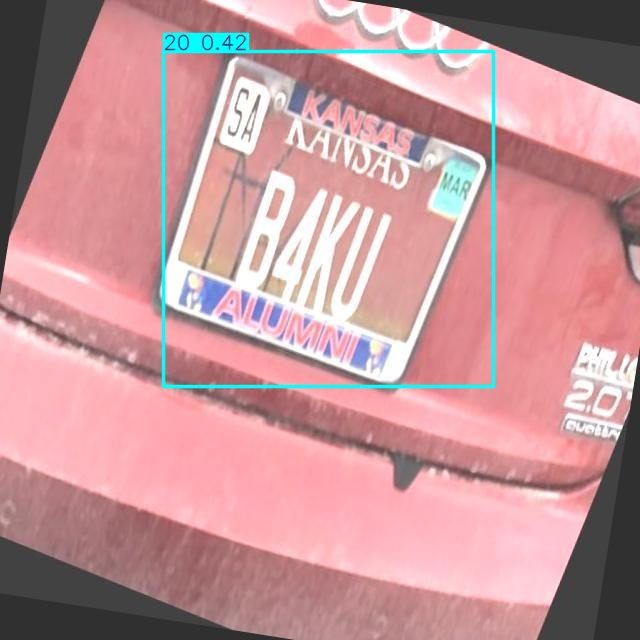

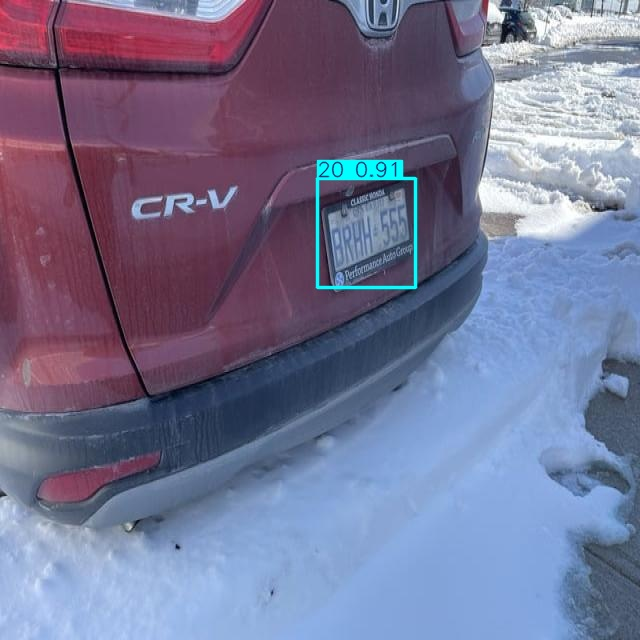

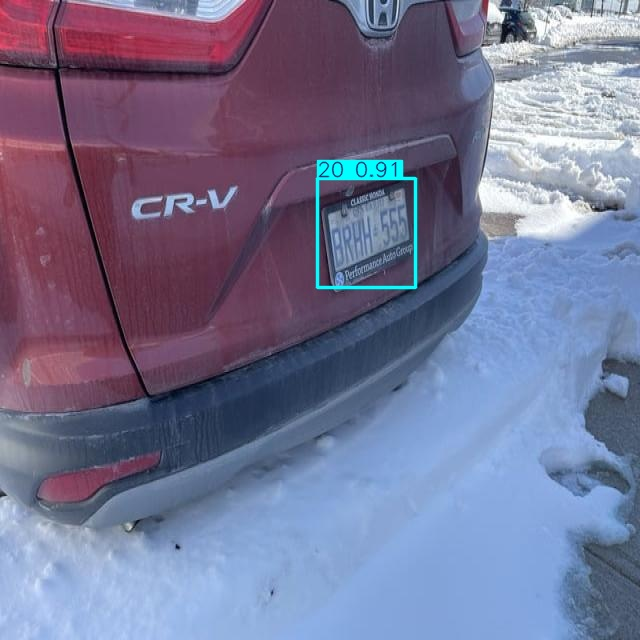

...

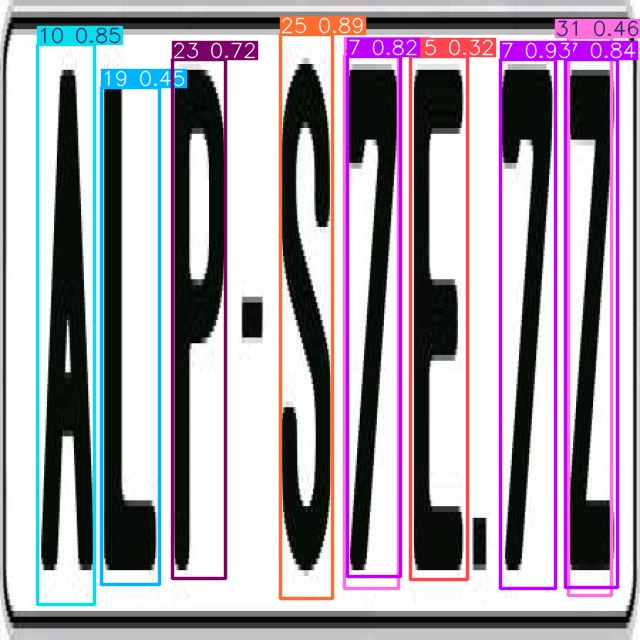

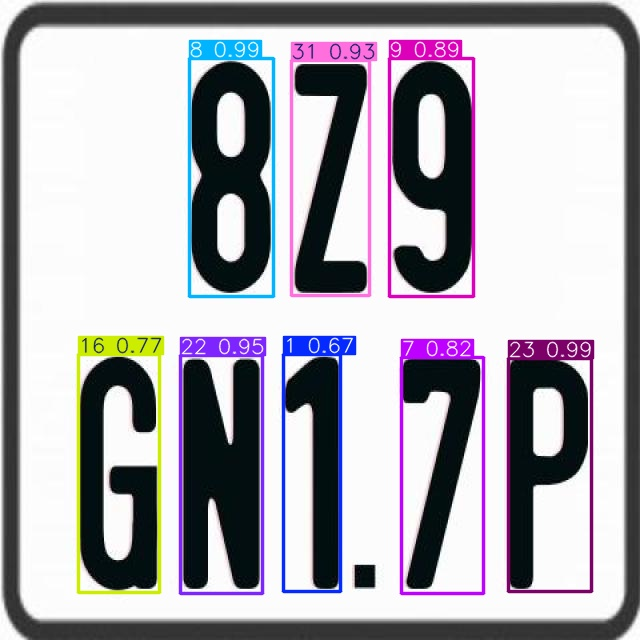

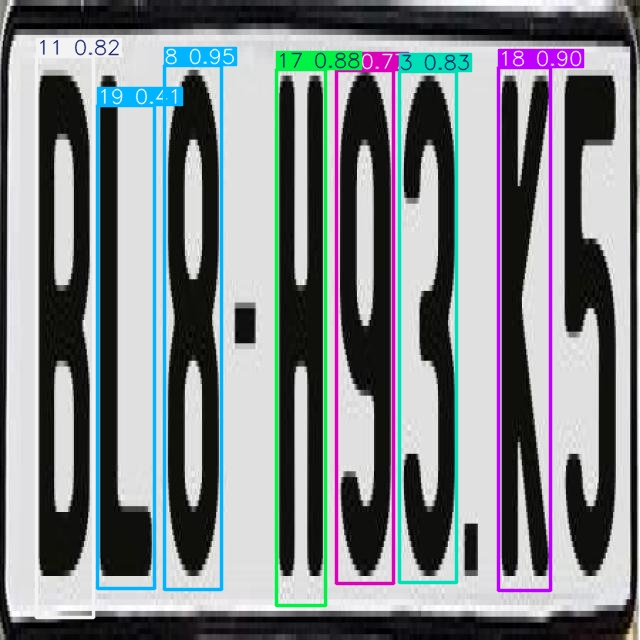

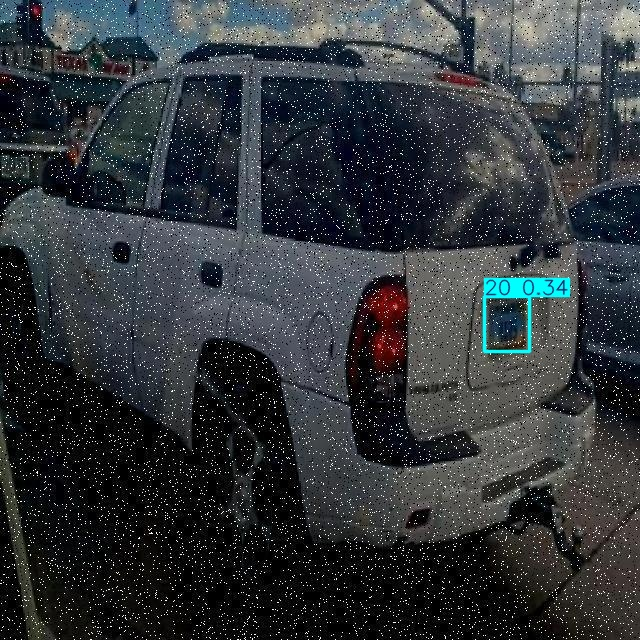

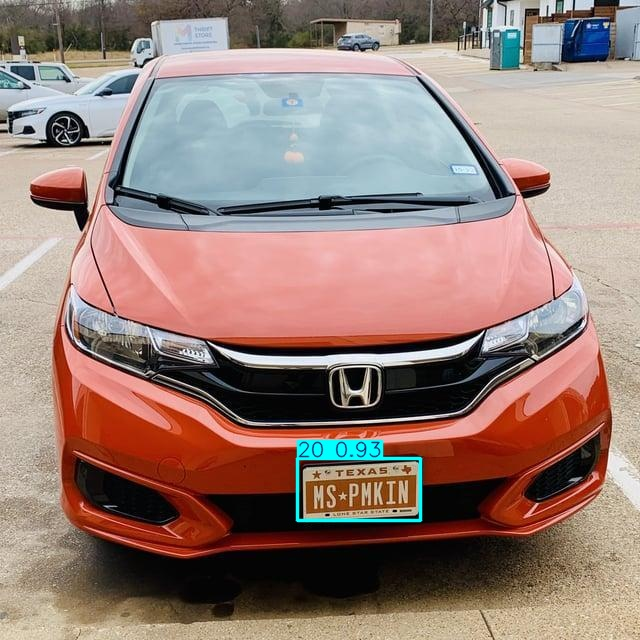

In [24]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict3/*.jpg'):
      display(Image(filename=image_path, width=300,height=300))
      print("\n")